In [1]:
import sys
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import math
import cmath
from math import *
from tqdm import tqdm
import time 
from smt.sampling_methods import LHS
import statsmodels as sm
import scipy as sp
from scipy.optimize import brentq
from mpl_toolkits.mplot3d import Axes3D 
from matplotlib import cm
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.decomposition import PCA
import keras
from keras.models import Model
from keras.layers import Dense, Input
from keras.datasets import mnist
from keras.regularizers import l1
from keras.optimizers import Adam
from sklearn.metrics import mean_squared_error





#      1 + g
#  ---------------------
#    1 + g exp( - gamma * T )
#
def arg_log( c_gmma, c_g, T):
    return (1.0 + c_g)/(1.0 + c_g*cmath.exp(-c_gmma*T))

#
#  C = 2 * log( (1 - g) / ( 1 - g e^{-gamma T } ) )/sigma^2
#  arg_log := (1 - g) / ( 1 - g e^{-gamma T } )
#
def C( c_gmma, c_g, sigma, T):
    c_psi = arg_log(c_gmma, c_g, T)
    return 2*cmath.log(c_psi)/pow(sigma,2)

#
# .5 ( v - v^2 )
#
def Lambda( c_v): 
    return .5*c_v - .5*c_v*c_v

#
# Gamma =  SQRT( kappa^2 + 2 L sigma^2 )
#
def Gamma( c_L, c_kappa, sigma):
    return cmath.sqrt(c_kappa*c_kappa + 2.*c_L*pow(sigma,2))
#
# g = ( gamma - kappa )/( gamma + kappa );
#
def G( c_kappa, c_gmma):
    return (c_gmma - c_kappa)/(c_gmma + c_kappa)

#
# Z_p = ( gamma - kappa )/sigma^2
#
def Z_p( c_gmma, c_kappa, sigma):
    return (c_gmma - c_kappa)/pow(sigma,2);
#
#
# A = -kappa * theta * ( zp * T - C)
#
def A_tT( c_gmma, c_g, c_zp, c_kappa, c_theta, sigma, T):
    c_c  = C( c_gmma, c_g, sigma, T)
    c_kt = c_kappa * c_theta
    return c_kt*(c_c - c_zp*T)
#
#
# B = zp * ( 1 - e^{-gamma T } )/( 1 + g e^{-gamma T} )
#
def B_tT( c_gmma, c_g, c_zp, T):
    c_exp_gt = cmath.exp(-c_gmma*T)
    return c_zp*(1. - c_exp_gt)/( 1. + c_g*c_exp_gt )


class Heston:
    """
    Represents the Heston stochastic volatility model.
    
    This class encapsulates the model parameters and provides methods to compute
    the characteristic function (CF) and its logarithm for use in option pricing
    via Fourier inversion techniques.
    """

    def __init__(self, **kwargs):
        """
        Initializes the Heston model with the given parameters.
        
        Parameters (passed as keyword arguments):
        ------------------------------------------
        lmbda : float
            Mean reversion speed of variance (kappa).
        eta   : float
            Volatility of volatility (sigma).
        nubar : float
            Long-run mean of the variance process (theta).
        nu_o  : float
            Initial variance at time t=0 (v0).
        rho   : float
            Correlation between the asset and variance Brownian motions.
        """
        self._lambda = kwargs["lmbda"]  # Mean reversion speed
        self._eta    = kwargs["eta"]    # Volatility of volatility
        self._nubar  = kwargs["nubar"]  # Long-term variance level
        self._nu_o   = kwargs["nu_o"]   # Initial variance
        self._rho    = kwargs["rho"]    # Correlation between asset and variance

    # ----------------------------------------
    # Property accessors for model parameters
    @property
    def lmbda(self): return self._lambda

    @property
    def eta(self): return self._eta

    @property
    def nubar(self): return self._nubar

    @property
    def nu_o(self): return self._nu_o

    @property
    def rho(self): return self._rho

    # ----------------------------------------

    def log_cf(self, c_k, t):
        """
        Computes the logarithm of the characteristic function at Fourier variable c_k and time t.
        
        Parameters:
        -----------
        c_k : complex
            Fourier variable (can be a complex number).
        t   : float
            Time to maturity.

        Returns:
        --------
        complex
            The value of the logarithm of the characteristic function at c_k and time t.
        """

        # Special case: when c_k has no real part, CF is trivially 1 (log(1) = 0).
        if c_k.real == 0.0:
            return 0.0 + 0.0j

        # Step 1: Pre-compute basic quantities
        c_v     = c_k * 1j            # Fourier variable multiplied by imaginary unit
        c_L     = Lambda(c_v)         # Lambda term (quadratic in c_v)
        c_kappa = self.lmbda - self.rho * self.eta * c_v  # Modified mean reversion under Fourier space
        c_gmma  = Gamma(c_L, c_kappa, self.eta)           # Gamma function
        c_g     = G(c_kappa, c_gmma)                      # g parameter (controls damping)
        c_zp    = Z_p(c_gmma, c_kappa, self.eta)          # z+ helper quantity

        # Step 2: Compute A and B components of the CF exponent
        if self.lmbda == 0.0:
            c_A = 0.0 + 0.0j
        else:
            c_theta = (self.lmbda * self.nubar) / c_kappa  # Instantaneous mean reversion level
            c_A = A_tT(c_gmma, c_g, c_zp, c_kappa, c_theta, self.eta, t)  # A(t,T) term

        c_B = B_tT(c_gmma, c_g, c_zp, t)  # B(t,T) term

        # Step 3: Return the log characteristic function
        return c_A - self.nu_o * c_B

    # ----------------------------------------

    def cf(self, c_k, t):
        """
        Computes the characteristic function at Fourier variable c_k and time t.

        Parameters:
        -----------
        c_k : complex
            Fourier variable (can be a complex number).
        t   : float
            Time to maturity.

        Returns:
        --------
        complex
            The value of the characteristic function at c_k and time t.
        """

        # First, compute the logarithm of the characteristic function
        c_x = self.log_cf(c_k, t)

        # Then exponentiate to get the characteristic function itself
        return cmath.exp(c_x)

def pr_x_lt_w(self, Xc, w, off, t):
    """
    Computes the cumulative probability P(X_T < w) under the Heston model,
    using a Fourier series expansion (cosine/sine series).

    Parameters:
    -----------
    self : Heston
        An instance of the Heston model (providing the characteristic function).
    Xc : float
        Cut-off value (integration domain is [0, Xc]).
    w : float
        Log-strike: log(Strike / S0), the critical barrier in log-space.
    off : complex
        A phase offset for the Fourier variable (used to shift the integration contour).
    t : float
        Time to maturity.

    Returns:
    --------
    float
        The cumulative probability P(X_T < w).
    """
    m = 1            # Start from the first nonzero Fourier mode (only odd terms are considered)
    tot = 0.0        # Total accumulated sum of the Fourier series
    while True:
        # Compute Fourier frequency (with offset)
        c_k = 2 * math.pi * (m / (2 * Xc) + off)
        # Evaluate the characteristic function at this Fourier point
        c_phi = self.cf(c_k, t)
        # Compute the angle theta = π m w / Xc
        th = math.pi * m * w / Xc
        # Compute the contribution of this Fourier mode to the series
        delta = (cos(th) * c_phi.imag - sin(th) * c_phi.real) / m
        # Accumulate contribution
        tot += delta
        # Stopping condition: if the incremental contribution is tiny relative to total sum
        if fabs(delta / tot) < 1.e-10:
            break
        # Move to next odd integer (only odd harmonics matter)
        m += 2
    # Final cumulative probability result
    return 0.5 - 2.0 * tot / math.pi


def ft_opt(self, Strike, T, Xc):
    """
    Computes European call and put option prices under the Heston model
    using Fourier inversion techniques.

    Parameters:
    -----------
    self : Heston
        An instance of the Heston model (providing the characteristic function).
    Strike : float
        Strike price of the option (normalized by initial stock price if needed).
    T : float
        Time to maturity (in years).
    Xc : float
        Truncation limit for the Fourier integral (upper bound of integration).

    Returns:
    --------
    dict
        A dictionary containing:
            "put"  : price of the put option,
            "call" : price of the call option,
            "pCn"  : probability-like term from integration for put,
            "pAn"  : auxiliary integration term used internally.
    """
    # Convert the Strike into log-strike (log-moneyness)
    w = log(Strike)
    # -----------------------------------
    # First integration (no contour shift)
    off = complex(0.0, 0.0)     # No offset
    cn = pr_x_lt_w(self, Xc, w, off, T)  # Probability integral without shift
    # -----------------------------------
    # Second integration (shifted contour)
    off = complex(0.0, -1 / (2 * math.pi))  # Shift downward by imaginary 1/(2π)
    an = pr_x_lt_w(self, Xc, w, off, T)     # Auxiliary integral with contour shift
    # -----------------------------------
    # Recover put and call prices
    # Put price = K * cn - an
    put = Strike * cn - an
    # Store cn and an as well
    pcn = cn
    pan = an
    # Use put-call parity to recover call price
    # Call = Put + (S0 - K), assuming normalized S0 = 1
    call = put + (1.0 - Strike)
    # Return a full dictionary with detailed results
    return {
        "put": put,
        "call": call,
        "pCn": pcn,
        "pAn": pan
    }

def HestonPut(St, Strike, T, kappa, theta, sigma, v0, rho, r, Xc=30):
    """
    Prices a European put option under the Heston stochastic volatility model.

    Parameters:
    -----------
    St     : float
        Current spot price of the underlying asset (S_0).
    Strike : float
        Strike price of the option (K).
    T      : float
        Time to maturity (in years).
    kappa  : float
        Speed of mean reversion of variance (lambda in Heston model).
    theta  : float
        Long-run variance (nubar in Heston model).
    sigma  : float
        Volatility of volatility (eta in Heston model).
    v0     : float
        Initial variance (nu_0).
    rho    : float
        Correlation between asset and volatility Brownian motions.
    r      : float
        Risk-free interest rate.
    Xc     : float, optional (default=30)
        Truncation limit for the Fourier integral (integration range 0 to Xc).

    Returns:
    --------
    float
        Price of the European put option.
    """
    # Adjust the strike for discounting under risk-neutral measure:
    # kT is the "discounted moneyness": (K / S_0) * exp(-rT)
    kT = (Strike / St) * math.exp(-r * T)
    # Create a Heston model object using the input parameters.
    hestn = Heston(
        lmbda=kappa,  # mean reversion speed
        eta=sigma,    # volatility of volatility
        nubar=theta,  # long-term variance
        nu_o=v0,      # initial variance
        rho=rho       # correlation
    )
    # Compute option prices (both call and put) via Fourier inversion.
    # The 'ft_opt' function internally use the characteristic function 
    # and numerical integration to retrieve option prices.
    res = ft_opt(hestn, kT, T, Xc)
    # Return the price of the put option from the results.
    return res['put']


def Put_call_parity(put, call, S_t, r, T, K, from_put_to_call = True):
    if from_put_to_call:
        call_out = put + S_t - np.exp(-r*T) * K
        return call_out
    else: 
        put_out = call - S_t + np.exp(-r*T) * K
        return put_out
    

def lhs_sampling(rand, NUM, bounds=None):

    kw = list(bounds)

    # builds the array of bounds
    limits = np.empty( shape=(0,2) )
    for k in kw: limits = np.concatenate((limits, [bounds[k]]), axis=0)

    sampling = LHS(xlimits=limits)
    x   = sampling(NUM)

    X = pd.DataFrame()
    for n in range(len(kw)):
        tag = kw[n]
        X[tag] = x[:,n]


    y = np.where( 2*X["k"]*X["theta"] < np.power( X["sigma"], 2), 1, 0)
    p = (100.*np.sum(y))/NUM
    print("@ %-34s: %s = %6d out of %6d ( %.7f %s)" %("Info", "Feller violations", np.sum(y), NUM, p, "%"))

    return X

    
def parms_gen( lhs = None, Xc=10, strikes=None):

    if lhs is None: raise Exception("No data to process")
    x = lhs

    NUM = len(x["T"])

    X = pd.DataFrame()
    for tag in list(x):
        X[tag] = np.full(NUM,0.0, dtype = np.double)
    X["Price"] = np.full(NUM,0.0, dtype = np.double)
    
    __tStart = time.perf_counter()
    pCount = 0
    cCount = 0
    n      = 0
    
    for m in tqdm(range(NUM)):
        Fw    = 1.0
        K     = x["Strike"][m]

        fwPut = HestonPut( St     = Fw
                         , Strike = K
                         , T      = x["T"][m]
                         , kappa  = x["k"][m]
                         , theta  = x["theta"][m]
                         , sigma  = x["sigma"][m]
                         , v0     = x["v0"][m]
                         , r      = 0 
                         , rho    = x["rho"][m]
                         , Xc     = Xc)
        
        if fwPut < max(K-Fw,0.): 
            pCount += 1
            continue

        for tag in list(x):
            #X[tag][n] = x[tag][m]
            X.iloc[n, X.columns.get_loc(tag)] = x[tag][m]

        #X["Price"][n] = fwPut
        X.iloc[n, X.columns.get_loc("Price")] = fwPut
        n += 1
        # ---------------------------------------

    __tEnd = time.perf_counter()
    print("@ %-34s: elapsed %.4f sec" %("Seq. pricing", __tEnd - __tStart) )

    # Trim the original vector ....
    nSamples = n

    df = pd.DataFrame()
    for s in X.keys(): df[s] = np.copy(X[s][0:nSamples])
    print("@ %-34s: Violations Put=%d, Call=%d DB=%d out of %d" %("Info", pCount, cCount, nSamples, NUM))
    return df


def histo_params( x, title = "None"):
    keys = list(x)
    LEN  = len(keys)
    fig, ax = plt.subplots(1,LEN, figsize=(12,4))
    if not title == None: fig.suptitle(title)
    for n in range(LEN):
        tag  = keys[n]
        lo   = np.min(x[tag])
        hi   = np.max(x[tag])
        bins = np.arange(lo, hi, (hi-lo)/100.)
        ax[n].hist(x[tag], density=True, facecolor='g', bins=bins)
        ax[n].set_title(tag)
        n += 1
    plt.subplots_adjust(left=.05, right=.95, bottom=.10, top=.80, wspace=.50)
    plt.show()
    
def BS(S, K, r, sigma, T, option_type : str):
    """
    Args:
        S : Underliyng 
        K : strike
        r : riskfree rate
        sigma : vol
        T : time to maturity
        option_type : put or call 

    Returns:
        BS price of call or put
    """
    
    d_1 = (np.log(S/K) + (r + (sigma**2)/2)*(T))/(sigma*np.sqrt(T))
    d_2 = d_1 - sigma*np.sqrt(T)
    if option_type == "put":
        p = K*np.exp(-r*T)*sp.stats.norm.cdf(-d_2)- sp.stats.norm.cdf(-d_1)*S
        return p
    if option_type == "call":
        c = sp.stats.norm.cdf(d_1)*S - sp.stats.norm.cdf(d_2)*K*np.exp(-r*T)
        return c 
    
    

def implied_vol(price, S, K, T, r, option_type="put"):
    def objective(sigma):
        return BS(S, K, r, sigma, T, option_type) - price
    try:
        return brentq(objective, 1e-6, 5.0)
    except ValueError:
        return np.nan
    

def fast_implied_vol(S0, Mkt_Price, Tput, Kput, r, option_type="put", q=0.0, tolerance=1e-5):
    sigma_max = 1.0
    sigma_min = 0.01
    sigma_center = (sigma_max + sigma_min) / 2

    def bs_price(sigma):
        return BS(S0, Kput, r, sigma, Tput, option_type)

    # Expand sigma_max if BS price is too low
    while bs_price(sigma_max) < Mkt_Price and sigma_max < 10:
        sigma_max *= 2

    # Shrink sigma_min if BS price is too high
    while bs_price(sigma_min) > Mkt_Price and sigma_min > 0.00001:
        sigma_min *= 0.5

    max_iterations = 100
    iterations = 0

    while abs(bs_price(sigma_center) - Mkt_Price) > tolerance:
        if iterations > max_iterations:
            print(f"Warning: IV not converging for K={Kput}, T={Tput}")
            return np.nan

        if bs_price(sigma_center) < Mkt_Price:
            sigma_min = sigma_center
        else:
            sigma_max = sigma_center

        sigma_center = (sigma_max + sigma_min) / 2
        iterations += 1

    return sigma_center





In [2]:
# 10*29grid 
k_s = np.linspace(0.75, 2.25, 28)
t_s = np.arange(0.2, 3, 0.1)
St = 1
r = 0.02

In [ ]:
verbose = False
    
outputPrfx    = "full"
testPrfx      = "test"
targetPrfx    = "trgt"
    
EPS           = 0.00
XC            = 10.0 
    
# bounds for the random generation of model parameters
# and contract parameters
bounds = { "k":       [ .01   , 1.00]
         , "theta":   [ .01   ,  .80]
         , "sigma":   [ .01   , 1.00]
         , "v0":      [ .01   ,  .80]
         , "rho":     [-.99   , 0.00]
         , "T":       [ 1./12., 2.00]
         , "Strike":  [ .6    , 1.40]
         }

NUM     = 1000
TAG     = str(NUM) + '_MCA'
rand    = np.random.RandomState(42)

# strikes used to build the smile used as a regressor
strikes = np.arange(.8, 1.2, .025)
    


__tStart = time.perf_counter()
xDF = lhs_sampling(rand, NUM, bounds = bounds)
__tEnd = time.perf_counter()
print("@ %-34s: elapsed %.4f sec" %("LHS", __tEnd - __tStart) )


In [ ]:
ask_save_params = input("This wil erase the old paramaters file and save a new one, (y/n)")
if ask_save_params.lower() == 'y':
    xDF.to_pickle('Random_params.pkl')
    print("File saved.")
else:
    print("Save cancelled.")

In [3]:
random_params = pd.read_pickle("Random_params.pkl")

random_params = random_params.iloc[:, :-2]

random_params

,k,theta,sigma,v0,rho
0,0.658945,0.033305,0.108505,0.389595,-0.937035
1,0.828235,0.572875,0.887635,0.335085,-0.844965
2,0.230275,0.237125,0.530245,0.674785,-0.799425
3,0.611425,0.166025,0.420355,0.011185,-0.106425
4,0.946045,0.467015,0.300565,0.160495,-0.658845
...,...,...,...,...,...
995,0.356005,0.564975,0.280765,0.068065,-0.332145
996,0.863875,0.121785,0.739135,0.065695,-0.823185
997,0.804475,0.707965,0.480745,0.158915,-0.581625
998,0.285715,0.606845,0.231265,0.726925,-0.222255


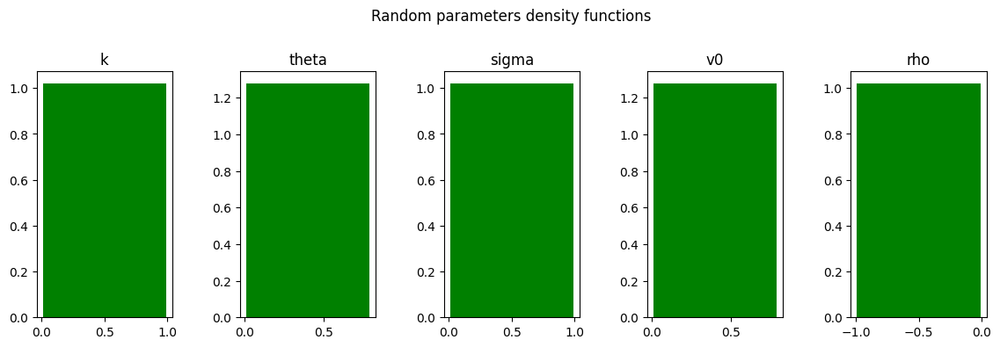

In [4]:
histo_params(random_params, title = "Random parameters density functions")

In [ ]:
# Be carefull before running this function it start the ivs calculation
num_samples = len(random_params)
iv_surface_bis_high_params_big_grid =  np.zeros((num_samples, len(k_s), len(t_s)))
for i, row in tqdm(random_params.iterrows(), total=len(random_params), desc="Processing Heston Params"):
    kappa, theta, sigma, v0, rho = row
    for j, K in enumerate(k_s):
        for k, T in enumerate(t_s):
            heston_price = St * HestonPut(St, K, T, kappa, theta, sigma, v0, rho, r, 30)
            iv = implied_vol(heston_price, St, K, T, r, option_type="put")
            iv_surface_bis_high_params_big_grid[i, j, k] = iv  



In [ ]:
confirm = input("Do you want to save the IV surface to 'iv_surface_28_x_28_1000.npy'? (y/n): ")
if confirm.lower() == 'y':
    np.save("iv_surface_28_x_28_1000.npy", iv_surface_bis_high_params_big_grid)
    print("File saved.")
else:
    print("Save cancelled.")

In [5]:
ivs = np.load("iv_surface_28_x_28_1000.npy")
ivs

array([[[0.61602838, 0.60663806, 0.5975311 , ..., 0.44838798,
         0.44389472, 0.43952523],
        [0.61318736, 0.6037915 , 0.59468002, ..., 0.44566994,
         0.4411902 , 0.43683466],
        [0.61051437, 0.6011129 , 0.59199683, ..., 0.44310968,
         0.43864278, 0.43430047],
        ...,
        [0.57169489, 0.56216873, 0.55294429, ..., 0.40559425,
         0.40133025, 0.39719812],
        [0.57052913, 0.56099767, 0.55176862, ..., 0.40445777,
         0.40020049, 0.39607535],
        [0.56938805, 0.5598515 , 0.55061786, ..., 0.403345  ,
         0.39909435, 0.3949761 ]],

       [[0.65566741, 0.65246776, 0.64947169, ..., 0.62502106,
         0.62488726, 0.62477733],
        [0.63752188, 0.63486438, 0.63240173, ..., 0.61641103,
         0.61647969, 0.61656333],
        [0.61986035, 0.61776508, 0.61585535, ..., 0.60829635,
         0.60855867, 0.60882724],
        ...,
        [0.37079084, 0.37157329, 0.37412896, ..., 0.49122938,
         0.4944617 , 0.49755614],
        [0.3

## Adding fake surfaces

In [6]:
anomalous_bounds = {
    "k":     [0.01, 1.00],     # maybe unchanged
    "theta": [0.8, 1.5],       # very high long-term vol
    "sigma": [1.0, 2.0],       # very high vol of vol
    "v0":    [0.8, 1.5],       # high initial vol
    "rho":   [-1.0, -0.95],    # extreme correlation
}
num_anom = 20
rand    = np.random.RandomState(42)

anomal_df = lhs_sampling(rand, num_anom, bounds = anomalous_bounds)

num_samples_anom = len(anomal_df)
anomalaous_ivs =  np.zeros((num_samples_anom, len(k_s), len(t_s)))
for i, row in tqdm(anomal_df.iterrows(), total=len(anomal_df), desc="Processing anomalous Heston Params"):
    kappa, theta, sigma, v0, rho = row
    for j, K in enumerate(k_s):
        for k, T in enumerate(t_s):
            heston_price_anomal = St * HestonPut(St, K, T, kappa, theta, sigma, v0, rho, r, 30)
            iv_anomal = implied_vol(heston_price_anomal, St, K, T, r, option_type="put")
            anomalaous_ivs[i, j, k] = iv_anomal

anomalaous_ivs.shape

@ Info                              : Feller violations =     17 out of     20 ( 85.0000000 %)


Processing anomalous Heston Params: 100%|██████████| 20/20 [01:04<00:00,  3.21s/it]


(20, 28, 28)

PCA: 
- Clean the real and fake dataset
- Merge the dataset with fake surfaces at the begininning to keep track of the index
- Do the routine

In [10]:


has_nan = np.isnan(ivs).any()

print("Contains NaN:", has_nan)

ivs.shape

Contains NaN: True


(1000, 28, 28)

In [ ]:
has_nan = np.isnan(anomalaous_ivs).any()

print("Contains NaN:", has_nan)

anomalaous_ivs.shape 

Contains NaN: True


(20, 28, 28)

In [12]:
mask = ~np.isnan(ivs).any(axis=(1, 2)) 
clean_iv_surface = ivs[mask]
has_nan = np.isnan(clean_iv_surface).any()


print("Contains NaN:", has_nan)

clean_iv_surface.shape

Contains NaN: False


(805, 28, 28)

In [13]:
mask_anomal = ~np.isnan(anomalaous_ivs).any(axis=(1, 2))
clean_anomal_iv_surface = anomalaous_ivs[mask_anomal]
has_nan = np.isnan(clean_anomal_iv_surface).any()

print("Contains NaN:", has_nan)

clean_anomal_iv_surface.shape

Contains NaN: False


(16, 28, 28)

In [14]:
clean_merged_ivs_surface_pca = np.concatenate([clean_anomal_iv_surface, clean_iv_surface], axis=0)
clean_merged_ivs_surface_pca.shape

(821, 28, 28)

In [16]:
n_assets_merged, n_strikes, n_T = clean_merged_ivs_surface_pca.shape
X_flatten_merged = clean_merged_ivs_surface_pca.reshape(n_assets_merged, -1)
X_flatten_merged.shape

(821, 784)

In [17]:
scaler = StandardScaler()
pca_2 = PCA()
X_scaled_merged = scaler.fit_transform(X_flatten_merged)
X_pca_merged = pca_2.fit_transform(X_scaled_merged)

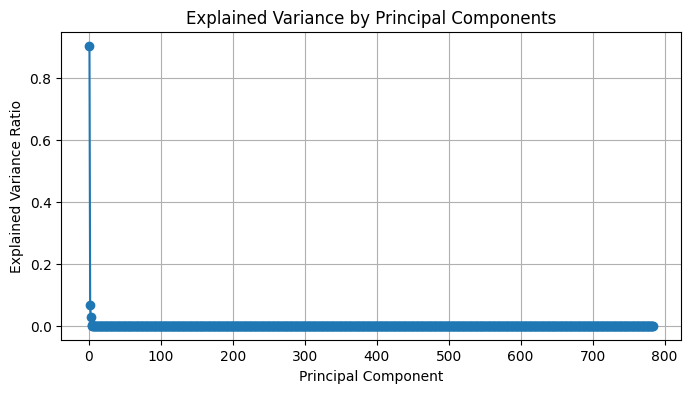

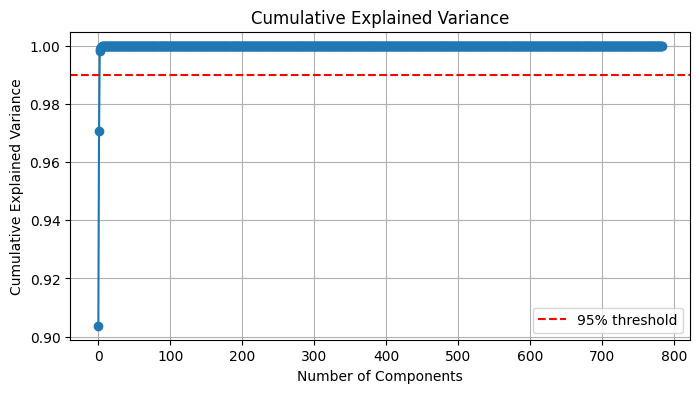

In [18]:
plt.figure(figsize=(8, 4))
plt.plot(np.arange(1, len(pca_2.explained_variance_ratio_) + 1), 
         pca_2.explained_variance_ratio_, marker='o')
plt.xlabel('Principal Component')
plt.ylabel('Explained Variance Ratio')
plt.title('Explained Variance by Principal Components')
plt.grid(True)
plt.show()

cumulative_variance_2 = np.cumsum(pca_2.explained_variance_ratio_)
plt.figure(figsize=(8, 4))
plt.plot(cumulative_variance_2, marker='o')
plt.xlabel('Number of Components')
plt.ylabel('Cumulative Explained Variance')
plt.title('Cumulative Explained Variance')
plt.grid(True)
plt.axhline(0.99, color='r', linestyle='--', label='95% threshold')
plt.legend()
plt.show()

In [19]:
n_comp_99_pca_2 = np.searchsorted(cumulative_variance_2, 0.99) + 1
print(f"The # of pc to explain 99% of variance in the dataset with anomalies is : {n_comp_99_pca_2}")

The # of pc to explain 99% of variance in the dataset with anomalies is : 3


In [20]:
pca_99_2 = PCA(n_components=n_comp_99_pca_2)
X_scaled_99_merged = scaler.fit_transform(X_flatten_merged)
X_pca_99_merged = pca_99_2.fit_transform(X_scaled_99_merged)

X_pca_99_merged.shape

(821, 3)

We use a 3 components PCA space, to detect outliers we use z score, since the point (0,0,0) in PCA space (P) is the mean, since the PCA is a linear transformation of mean centered data (StandardScaler), so we higlight any surface where:
\begin{align*}
z_{ij} = \frac{X_{ij} -\mu_{j}}{\sigma_j} \ \  \gt 3
\end{align*}
$X_{ij}$ is the score of the i-th IVS on the j-th PC, $\mu_j$ is the mean of the j-th PC and $\sigma_j$ is the sd of the j-th PC. The message is we take index of the IVS that is 3 sd away from the mean. 

In [21]:
z_scores_merged = np.abs(sp.stats.zscore(X_pca_99_merged, axis=0))
is_outlier_merged = (z_scores_merged > 3).any(axis=1)  # +-3 std in N is 99.7% of the values

anomalies_merged = np.where(is_outlier_merged)[0]

print(f"The number of anomalous IVS is: {len(anomalies_merged)}, that is the {round(len(anomalies_merged)/len(X_pca_99_merged)*100, 2)} % of the cleaned dataset.")
anomalies_merged

The number of anomalous IVS is: 12, that is the 1.46 % of the cleaned dataset.


array([  0,   1,   3,   4,   8,   9,  12,  14, 214, 397, 499, 633])

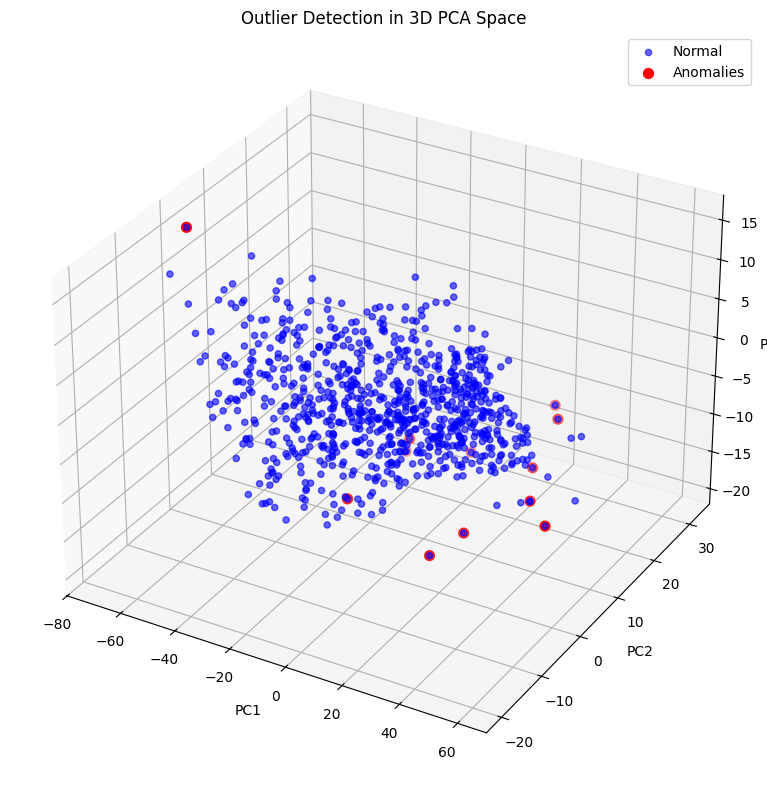

In [23]:
fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')

# Normal points
ax.scatter(X_pca_99_merged[:, 0], X_pca_99_merged[:, 1], X_pca_99_merged[:, 2], 
           c='blue', label='Normal', alpha=0.6)

# Anomalies
ax.scatter(X_pca_99_merged[anomalies_merged, 0], 
           X_pca_99_merged[anomalies_merged, 1], 
           X_pca_99_merged[anomalies_merged, 2], 
           c='red', label='Anomalies', s=50)

# Axis labels
ax.set_xlabel('PC1')
ax.set_ylabel('PC2')
ax.set_zlabel('PC3')
ax.set_title('Outlier Detection in 3D PCA Space')
ax.legend()
plt.tight_layout()
plt.show()

In [22]:
X_pca_99_reconstructed_merged = pca_99_2.inverse_transform(X_pca_99_merged)

mse_pca_merged = mean_squared_error(X_scaled_99_merged, X_pca_99_reconstructed_merged)

mse_pca_merged


0.0018540415821090657

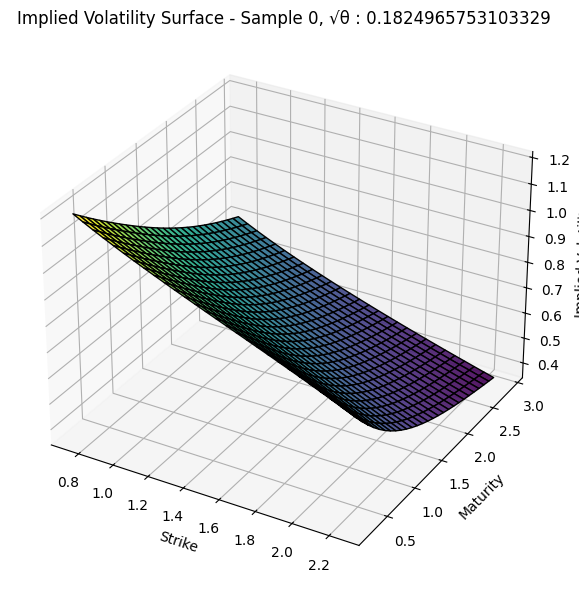

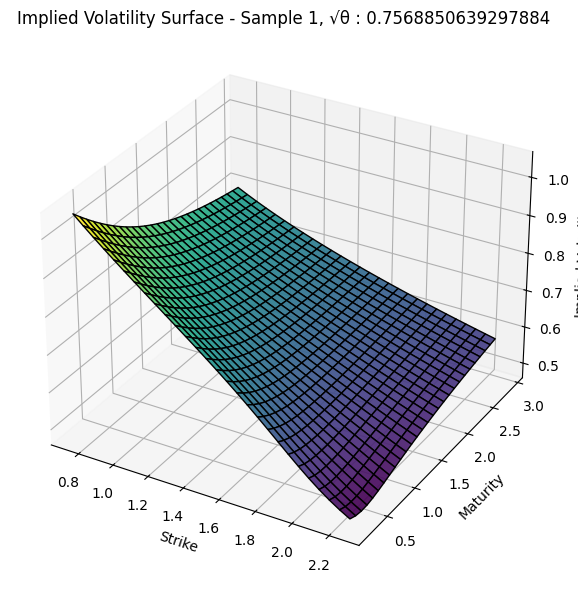

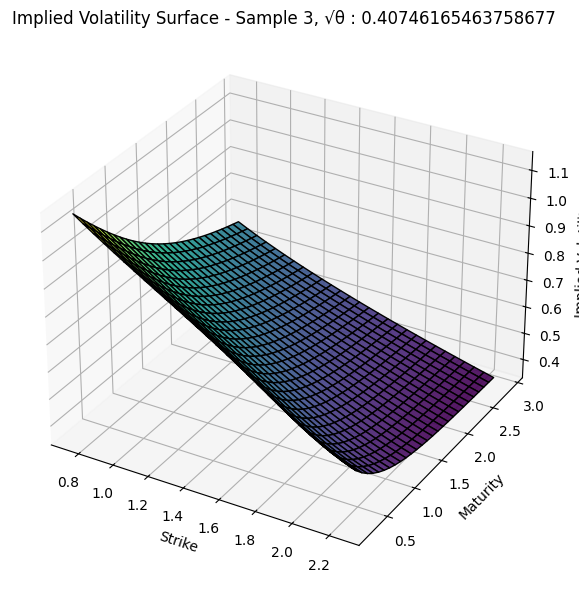

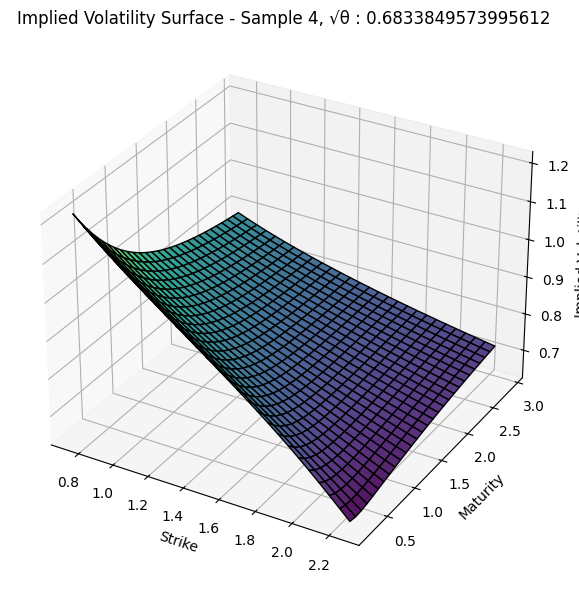

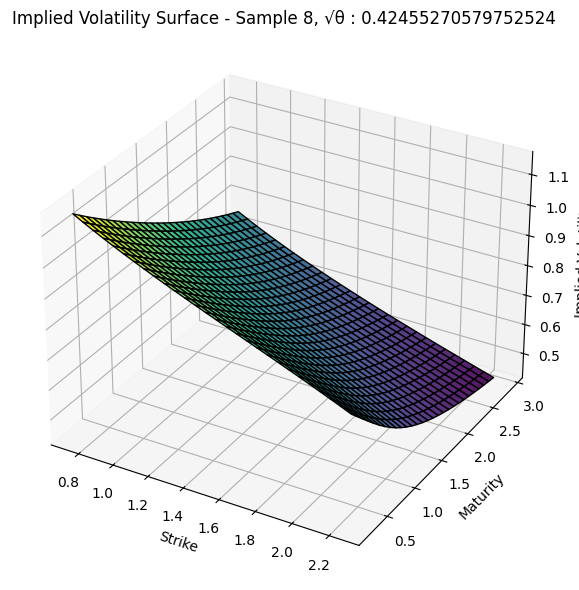

...

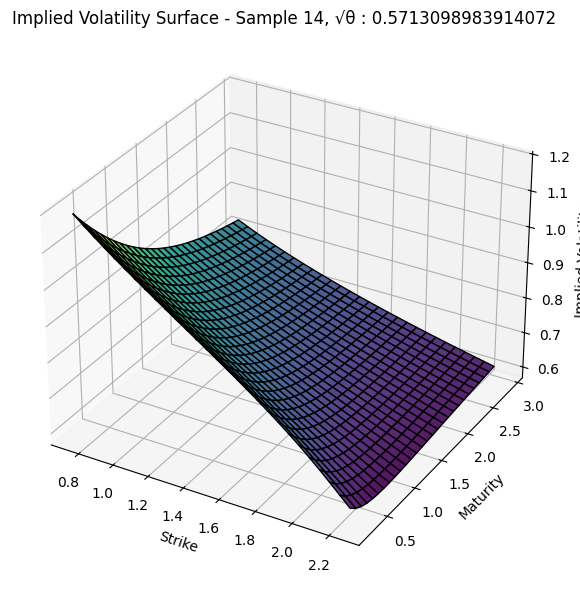

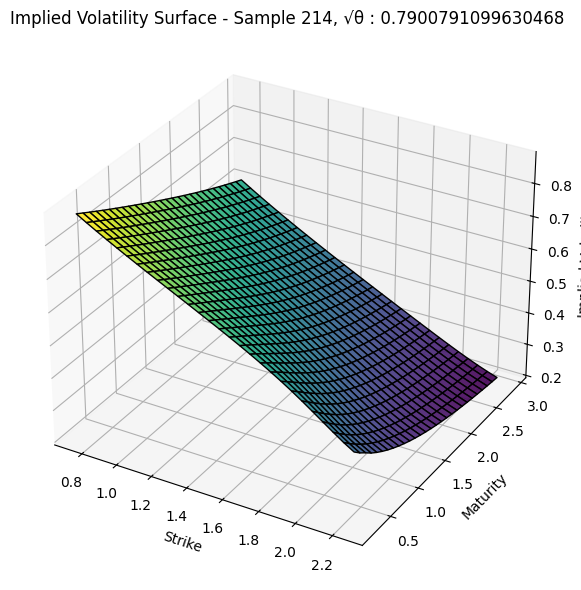

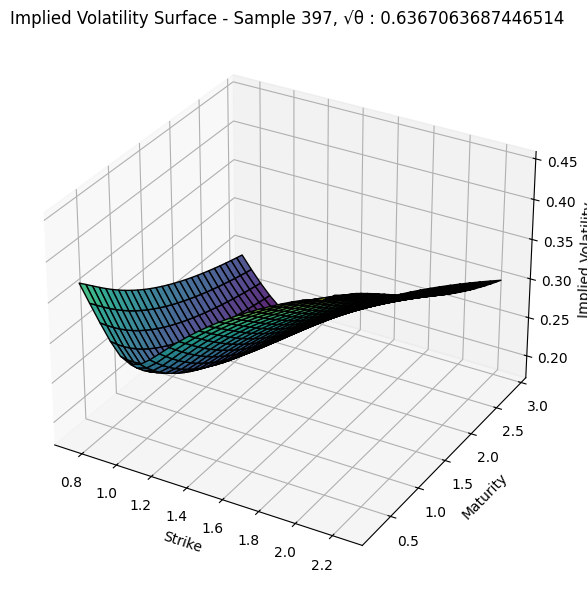

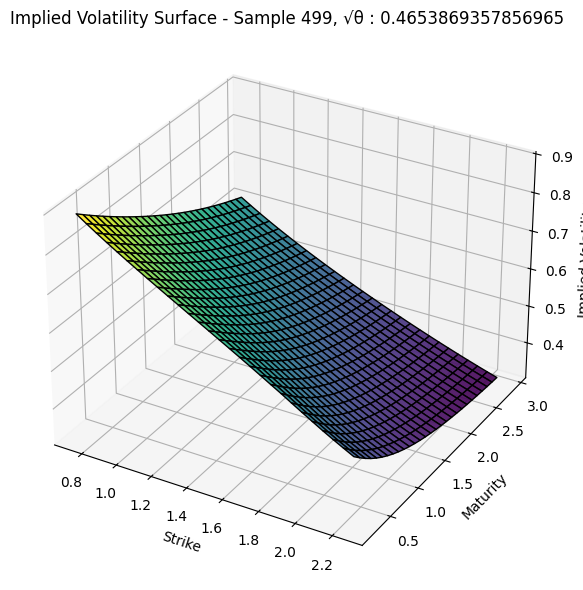

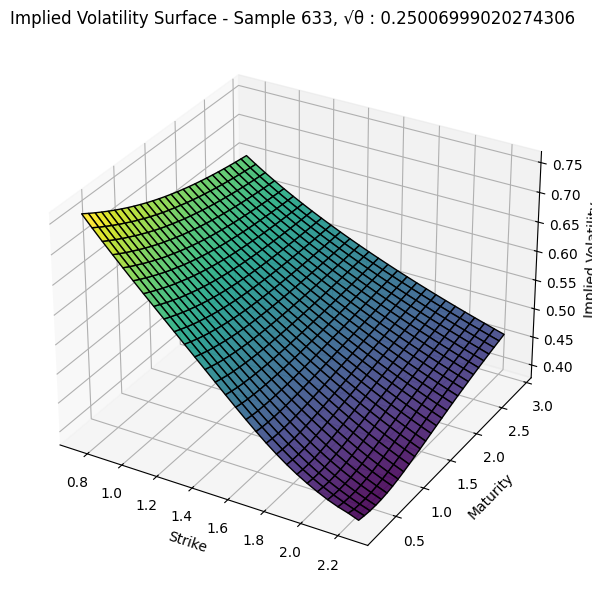

In [27]:
K, T = np.meshgrid(k_s, t_s, indexing='ij') 
for i in anomalies_merged:  # First 5 surfaces
    fig = plt.figure(figsize=(8, 6))
    ax = fig.add_subplot(111, projection='3d')

    
    IV = clean_merged_ivs_surface_pca[i]  

    # Plot surface
    ax.plot_surface(K, T, IV, cmap=cm.viridis, edgecolor='k', alpha=0.9)
    sqrt_theta = np.sqrt(random_params.iloc[i, 1])
    # Labels
    ax.set_title(f"Implied Volatility Surface - Sample {i}, √θ : {sqrt_theta}")
    ax.set_xlabel("Strike")
    ax.set_ylabel("Maturity")
    ax.set_zlabel("Implied Volatility")

    plt.tight_layout()
    plt.show()

## Autoencoder, non linear latent space

- Build and train SYMMETRIC ae with linear and nonlinear layers
- use reconstruction error to detect unusual surfaces
- Denoising variant

Since we strategically built our ivs to be a 28x28 grid we can use the ae proposed to analyze the number of the minst dataset. The reasoning applies beacause the f(x,y) in that case was the value of the grey scale, for us is just the value of the implied volatily for a combination of strike and maturity

We train the AE on 90% of the real dataset, then we merge the remainng 10% with the fake ivs to see if the AE can detect them with reconstruction error.m Alway the first in the merge to keep track of the indices

In [ ]:
percentage_of_train = 0.9

train_real_ivs = clean_iv_surface[:floor(len(clean_iv_surface)*percentage_of_train), :] # clean_iv_surface contains only the real ivs
n_sample_train = train_real_ivs.shape[0]


off_sample_real = clean_iv_surface[len(train_real_ivs): , :]

off_sample_merged = np.concatenate([clean_anomal_iv_surface, off_sample_real], axis=0)
n_sample_test = off_sample_merged.shape[0]

train_real_flatten = train_real_ivs.reshape(n_sample_train, -1)
off_sample_flatten = off_sample_merged.reshape(n_sample_test, -1)

print(f"Shape of flat training set is : {train_real_flatten.shape}")
print("\n","*"*25, "\n")
print(f"Shape of flat off-sample test test is : {off_sample_flatten.shape}")

Shape of flat training set is : (724, 784)

 ************************* 

Shape of flat off-sample test test is : (97, 784)


In [33]:
min_max_scaler = MinMaxScaler()

train_ae_scaled = min_max_scaler.fit_transform(train_real_flatten)

off_sample_scaled = min_max_scaler.fit_transform(off_sample_flatten)



We train on the real dataset, then perform detection on th off sample (a mix of real and fake surfaces)

In [31]:
# Define the size of the input layer, hidden layer, and the encoded representation (code size).
input_size  = 784  # Flattened number of strike-maturities combinations
hidden_size = 128  # Number of neurons in the hidden layer.
code_size   = 32  # Size of the compressed representation.

# Define the input layer with the shape equal to the input size.
input_ivs   = Input(shape=(input_size,))

# First hidden layer with `hidden_size` neurons and ReLU activation function, connected to the input layer.
hidden_1    = Dense(hidden_size, activation='relu')(input_ivs)

# The "code" layer that encodes the input image into a compressed representation, with `code_size` neurons.
code        = Dense(code_size, activation='relu')(hidden_1)

# Second hidden layer, which starts the process of decoding the encoded representation, 
# has the same number of neurons as the first hidden layer and uses ReLU activation.
hidden_2    = Dense(hidden_size, activation='relu')(code)

# Output layer that reconstructs the input image from the compressed code, 
# with the same size as the original input and sigmoid activation function for binary output.
output_img  = Dense(input_size, activation='sigmoid')(hidden_2)

# Creation of the autoencoder model, specifying the input and output layers.
autoencoder = Model(input_ivs, output_img)


autoencoder.compile(optimizer='adam', loss='mse')

autoencoder.summary()
for idx, layer in enumerate(autoencoder.layers):
        print('layer name : ', layer.name,'\t', 'id : ', idx)

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)        │ (None, 784)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 128)            │       100,480 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 32)             │         4,128 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 128)            │         4,224 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 784)            │       101,136 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 209,968 (820.19 KB)

 Trainable params: 209,968 (820.19 KB)

 Non-trainable params: 0 (0.00 B)

layer name :  input_layer 	 id :  0
layer name :  dense 	 id :  1
layer name :  dense_1 	 id :  2
layer name :  dense_2 	 id :  3
layer name :  dense_3 	 id :  4


In [34]:
history = autoencoder.fit(train_ae_scaled, train_ae_scaled, epochs=15)

Epoch 1/15
23/23 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.0419  
Epoch 2/15
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0298 
Epoch 3/15
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0235 
Epoch 4/15
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0203
Epoch 5/15
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0154 
Epoch 6/15
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0143
Epoch 7/15
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0104 
Epoch 8/15
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0068
Epoch 9/15
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0045 
Epoch 10/15
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0036 
Epoch 11/15
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0020 
Epoch 12/15
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0020 
Epoch 13/15
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0014 
Epoch 14/15
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0011 
Epoch 15/15
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0013    


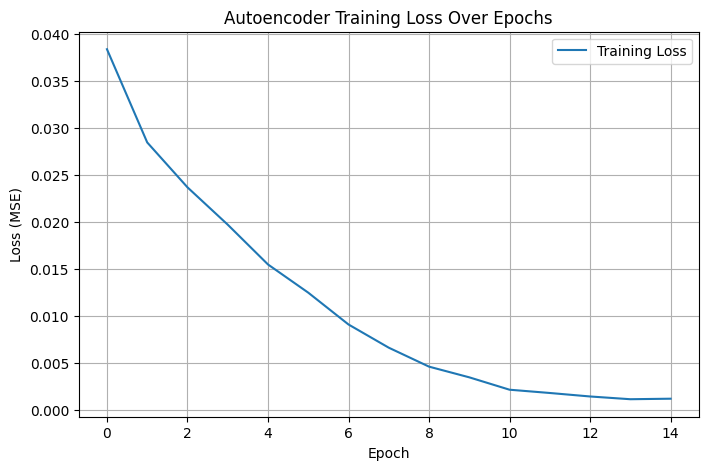

In [36]:
plt.figure(figsize=(8, 5))
plt.plot(history.history['loss'], label='Training Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss (MSE)')
plt.title('Autoencoder Training Loss Over Epochs')
plt.grid(True)
plt.legend()
plt.show()

3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


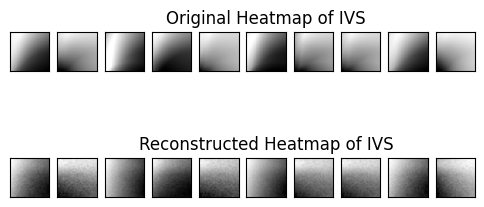

In [37]:
def plot_autoencoder_outputs(autoencoder, n, dims, X_test):
    # Predict the outputs for the test set using the trained autoencoder model.
    decoded_imgs = autoencoder.predict(X_test)

    # Set up the figure size for plotting the images.
    plt.figure(figsize=(6, 3))
    for i in range(n):  # Loop over `n` examples to display.
        # Plot original image.
        ax = plt.subplot(2, n, i + 1)  # Create a subplot for the original image.
        plt.imshow(X_test[i].reshape(*dims))  # Reshape and display the original image from the test set.
        plt.gray()  # Use grayscale color map.
        ax.get_xaxis().set_visible(False)  # Hide the x-axis.
        ax.get_yaxis().set_visible(False)  # Hide the y-axis.
        if i == n/2:  # Optionally, set a title for the middle image of the original set.
            ax.set_title('Original Heatmap of IVS')

        # Plot reconstructed image.
        ax = plt.subplot(2, n, i + 1 + n)  # Create a subplot for the reconstructed image.
        plt.imshow(decoded_imgs[i].reshape(*dims))  # Reshape and display the decoded (reconstructed) image.
        plt.gray()  # Use grayscale color map.
        ax.get_xaxis().set_visible(False)  # Hide the x-axis.
        ax.get_yaxis().set_visible(False)  # Hide the y-axis.
        if i == n/2:  # Optionally, set a title for the middle image of the reconstructed set.
            ax.set_title('Reconstructed Heatmap of IVS')
    
    # Display the plot containing both original and reconstructed images.
    plt.show()


plot_autoencoder_outputs(autoencoder, 10, (28, 28), off_sample_scaled[:-5])

In [45]:
reconstructed_ae_off_sample = autoencoder.predict(off_sample_scaled)
rec_error_ae = np.mean((off_sample_scaled - reconstructed_ae_off_sample) ** 2, axis=1)

threshold = np.percentile(rec_error_ae, 85)

anomalies_ae = np.where(rec_error_ae > threshold)[0]
anomalies_ae

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 


array([ 0,  1,  3, 13, 36, 41, 46, 50, 51, 60, 62, 90, 92, 93, 95])

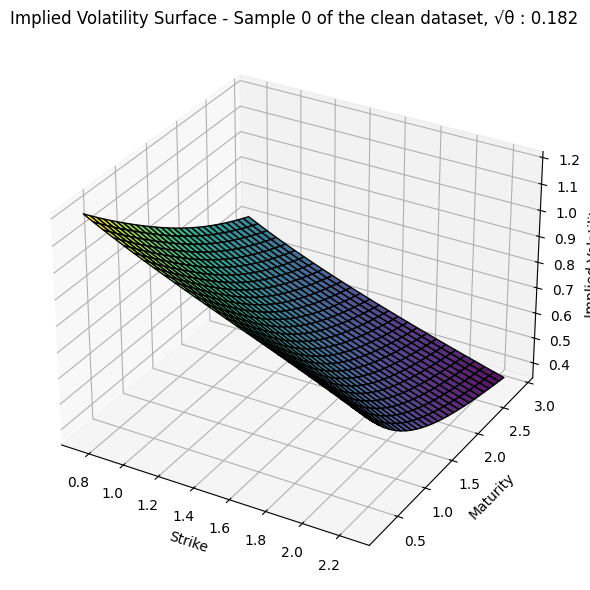

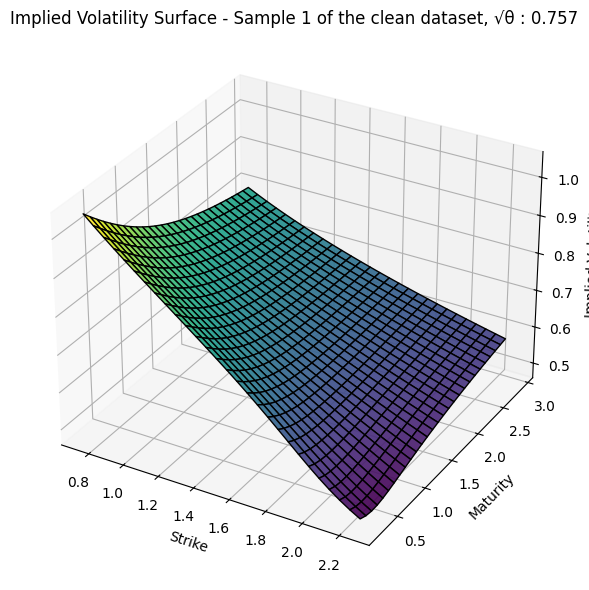

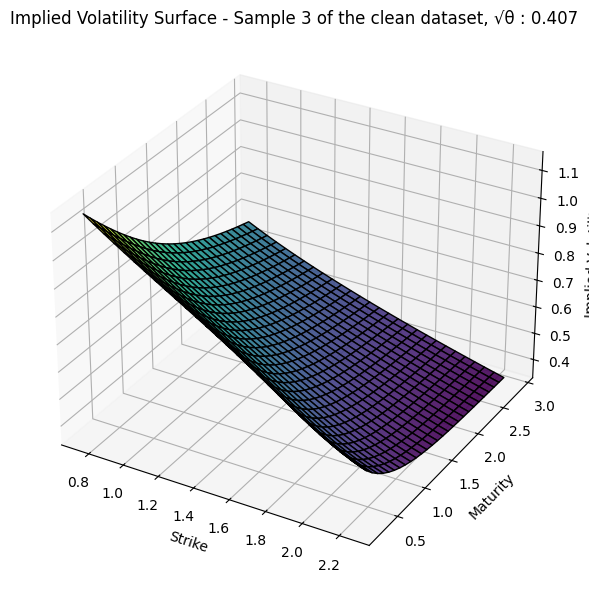

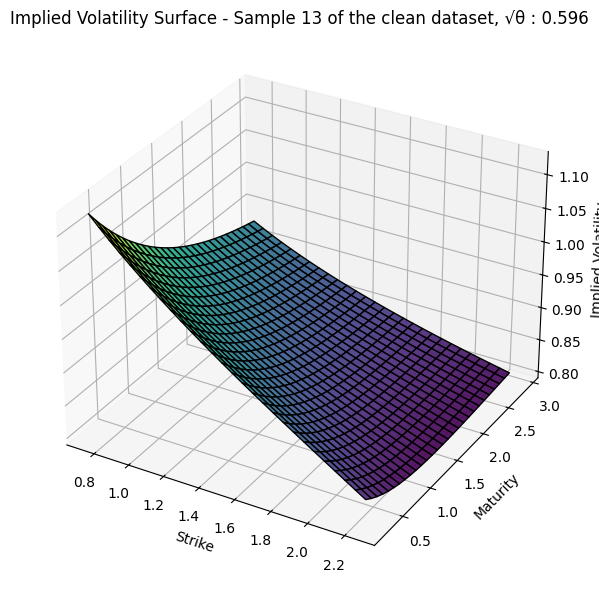

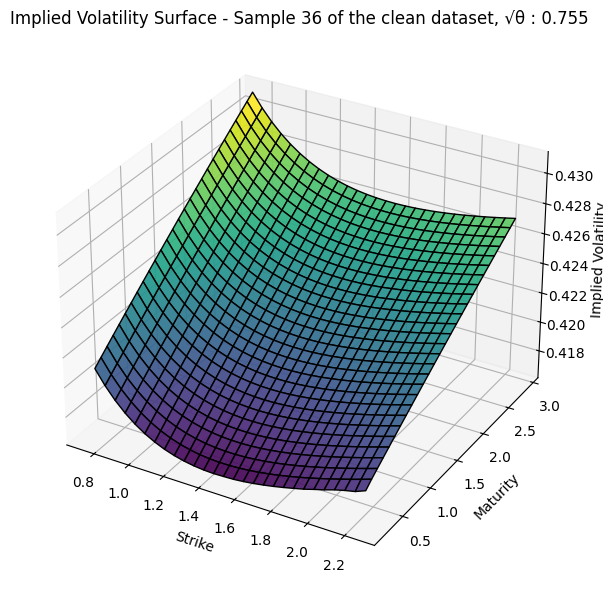

...

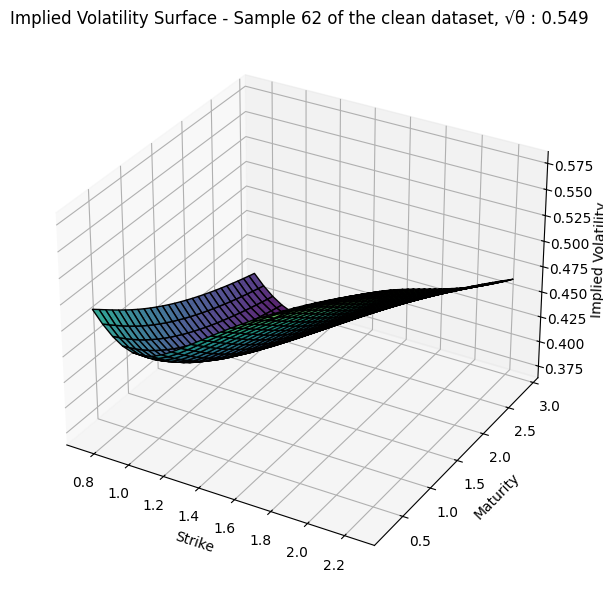

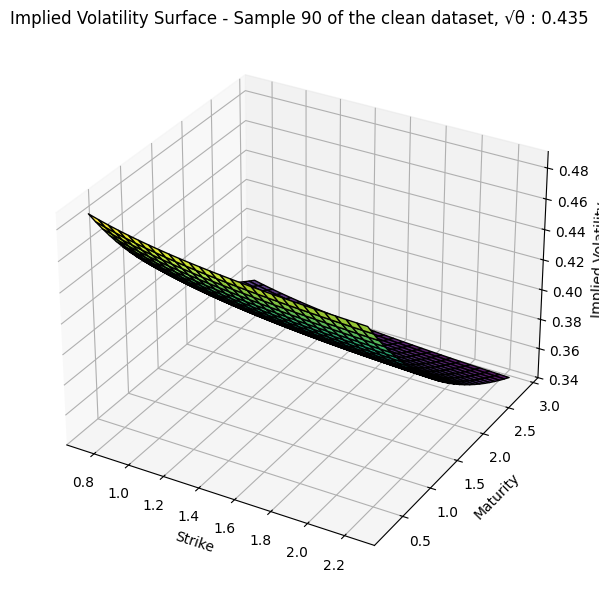

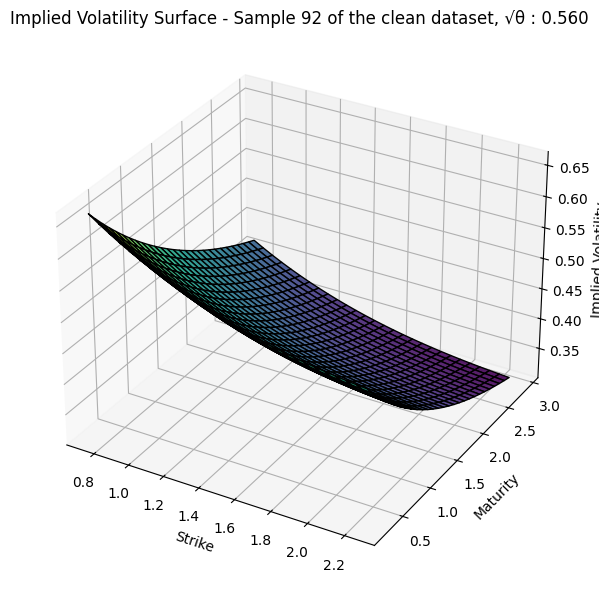

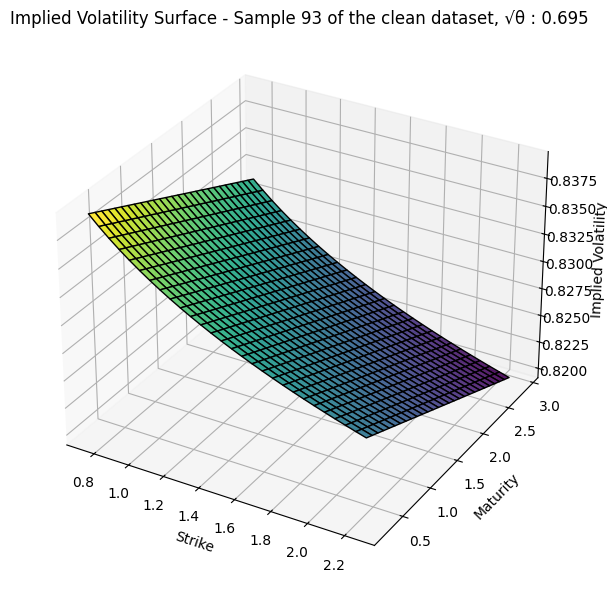

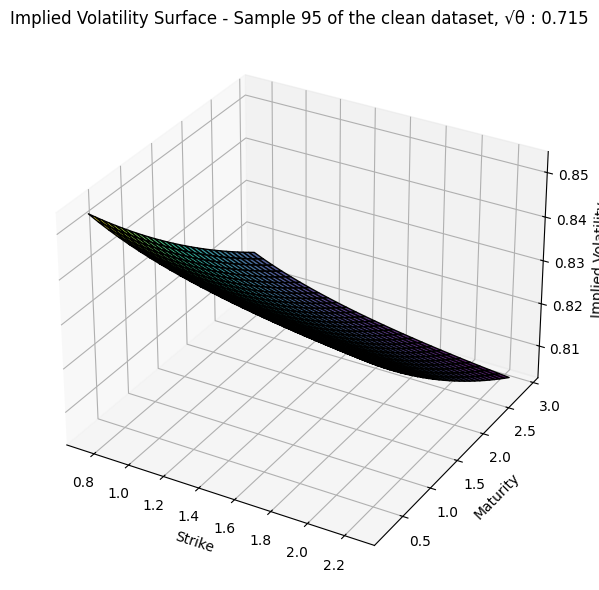

In [46]:
for i in anomalies_ae: 
    fig = plt.figure(figsize=(8, 6))
    ax = fig.add_subplot(111, projection='3d')

    
    IV = off_sample_merged[i]  

    # Plot surface
    ax.plot_surface(K, T, IV, cmap=cm.viridis, edgecolor='k', alpha=0.9)
    sqrt_theta = np.sqrt(random_params.iloc[i, 1])
    # Labels
    ax.set_title(f"Implied Volatility Surface - Sample {i} of the clean dataset, √θ : {sqrt_theta:.3f}")
    ax.set_xlabel("Strike")
    ax.set_ylabel("Maturity")
    ax.set_zlabel("Implied Volatility")

    plt.tight_layout()
    plt.show()

In [52]:

anomal_detected_pca = np.count_nonzero(anomalies_merged <= len(clean_anomal_iv_surface))
anomal_detected_ae = np.count_nonzero(anomalies_ae <= clean_anomal_iv_surface.shape[0])

print("*"*25)
print(f"PCA model performance: \n")
print(f"Dataset Dimension : {clean_merged_ivs_surface_pca.shape} \n")
print(f"Anomalies correctly detected : {anomal_detected_pca} out of {len(clean_anomal_iv_surface)} fake generated ivs \n")
print(f"Total number of detected anomalies : {len(anomalies_merged)} (also real ivs missclassified as fake)\n ")
print(f"The Rec. error is : {mse_pca_merged:.6f}")
print("*"*25)
print(f"AE model performance: \n")
print(f"Train dataset Dimension : {train_ae_scaled.shape} \n")
print(f"Off-sample dataset Dimension : {off_sample_merged.shape} \n")
print(f"Anomalies correctly detected : {anomal_detected_ae} out of {len(clean_anomal_iv_surface)} fake generated ivs \n")
print(f"Total number of detected anomalies : {len(clean_anomal_iv_surface)} (also real ivs missclassified as fake)\n")
print(f"The Rec. error is : {np.mean(rec_error_ae):.6f}")
print("*"*25)

if anomal_detected_pca > anomal_detected_ae and mse_pca_merged > np.mean(rec_error_ae):
    print("The AE is overfitting, ie it has a rec. error lower than PCA error but it detect less fake surfaces")


*************************
PCA model performance: 

Dataset Dimension : (821, 28, 28) 

Anomalies correctly detected : 8 out of 16 fake generated ivs 

Total number of detected anomalies : 12 (also real ivs missclassified as fake)
 
The Rec. error is : 0.001854
*************************
AE model performance: 

Train dataset Dimension : (724, 784) 

Off-sample dataset Dimension : (97, 28, 28) 

Anomalies correctly detected : 4 out of 16 fake generated ivs 

Total number of detected anomalies : 16 (also real ivs missclassified as fake)

The Rec. error is : 0.003074
*************************


In [53]:
intersection_detected_anomalies = np.intersect1d(anomalies_merged, anomalies_ae)
intersection_detected_anomalies


array([0, 1, 3])

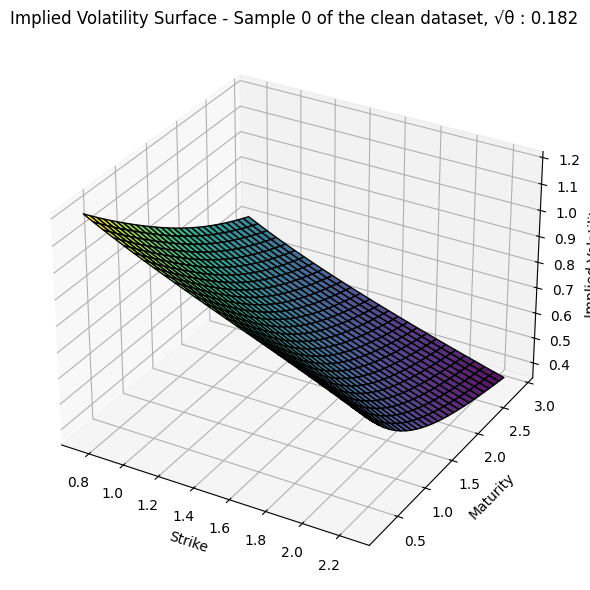

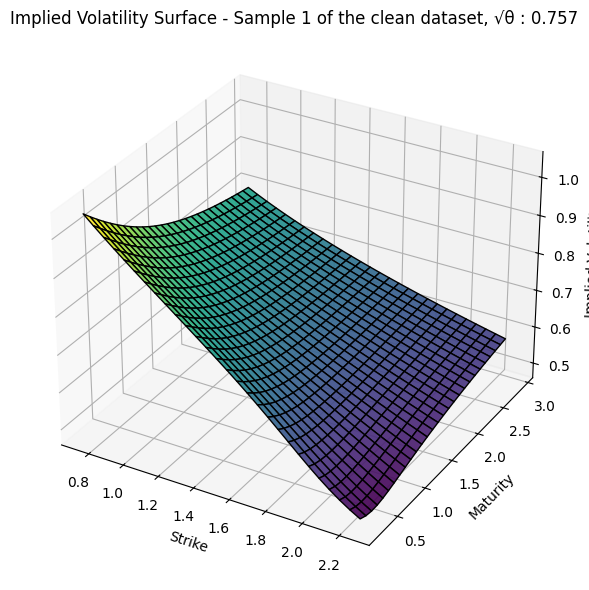

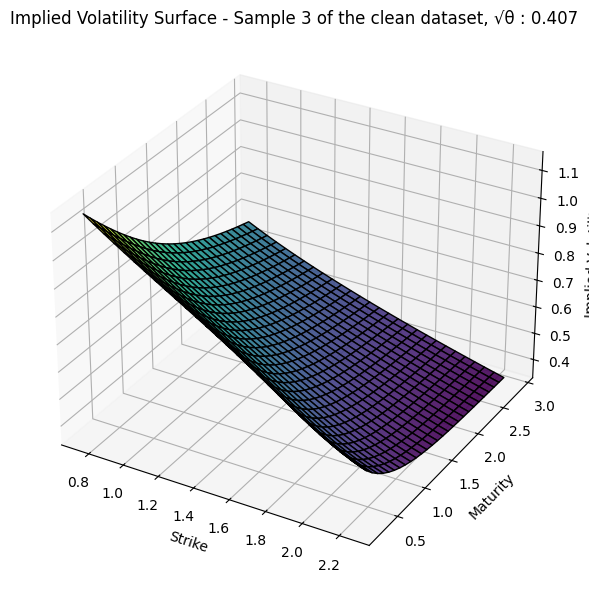

In [54]:
for i in intersection_detected_anomalies: 
    fig = plt.figure(figsize=(8, 6))
    ax = fig.add_subplot(111, projection='3d')

    
    IV = clean_merged_ivs_surface_pca[i]  

    # Plot surface
    ax.plot_surface(K, T, IV, cmap=cm.viridis, edgecolor='k', alpha=0.9)
    sqrt_theta = np.sqrt(random_params.iloc[i, 1])
    # Labels
    ax.set_title(f"Implied Volatility Surface - Sample {i} of the clean dataset, √θ : {sqrt_theta:.3f}")
    ax.set_xlabel("Strike")
    ax.set_ylabel("Maturity")
    ax.set_zlabel("Implied Volatility")

    plt.tight_layout()
    plt.show()

# Optional part: Greeks

In [55]:
def compute_put_delta(ivs, spot_prices, strike_prices, maturities, r=0.0):
    """
    Compute the Black-Scholes put delta surface for a batch of IV surfaces.

    Args:
        ivs: numpy array, shape (n_assets, n_strike, n_maturities)
        spot_prices: array-like, shape (n_assets,)
        strike_prices: array-like, shape (n_strike,)
        maturities: array-like, shape (n_maturities,)
        r: risk-free rate (float)

    Returns:
        put_delta: numpy array, shape (n_assets, n_strike, n_maturities)
    """
    S = spot_prices[:, None, None]                # (n_assets, 1, 1)
    K = strike_prices[None, :, None]              # (1, n_strike, 1)
    T = maturities[None, None, :]                 # (1, 1, n_maturities)
    sigma = ivs                                   # (n_assets, n_strike, n_maturities)



    d1 = (np.log(S / K) + (r + 0.5 * sigma ** 2) * T) / (sigma * np.sqrt(T))
    put_delta = sp.stats.norm.cdf(d1) - 1
    return put_delta

spot_prices = np.ones(len(clean_merged_ivs_surface_pca))
#spot_prices = np.random.randint(5, 15, size=len(clean_merged_ivs_surface))
put_delta = compute_put_delta(clean_merged_ivs_surface_pca, spot_prices, k_s, t_s, r=r)

put_delta.shape

(821, 28, 28)

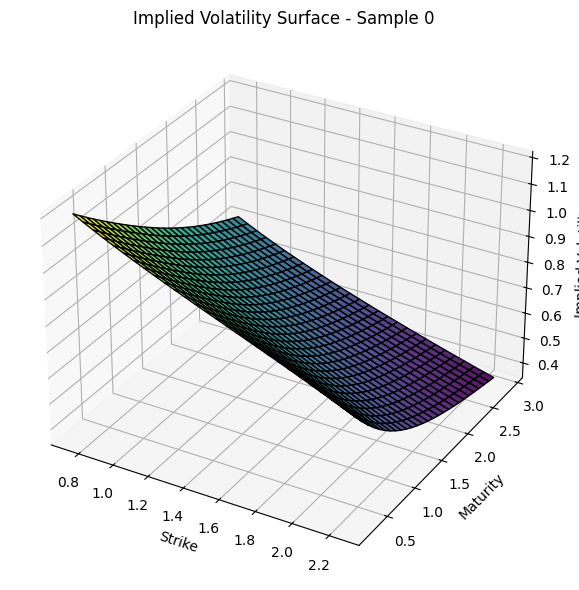

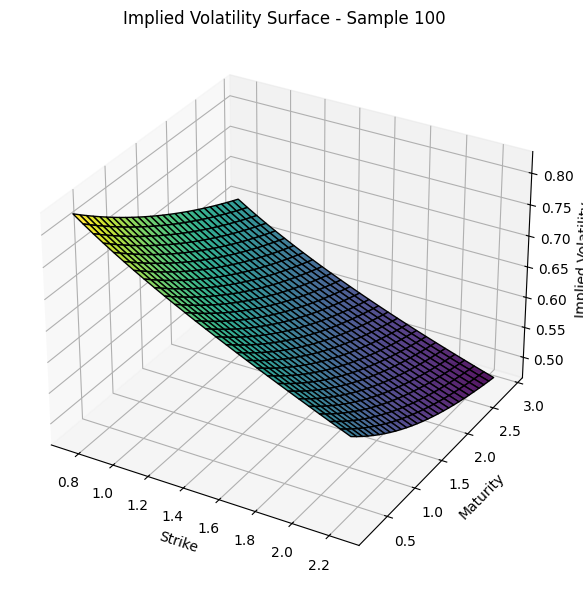

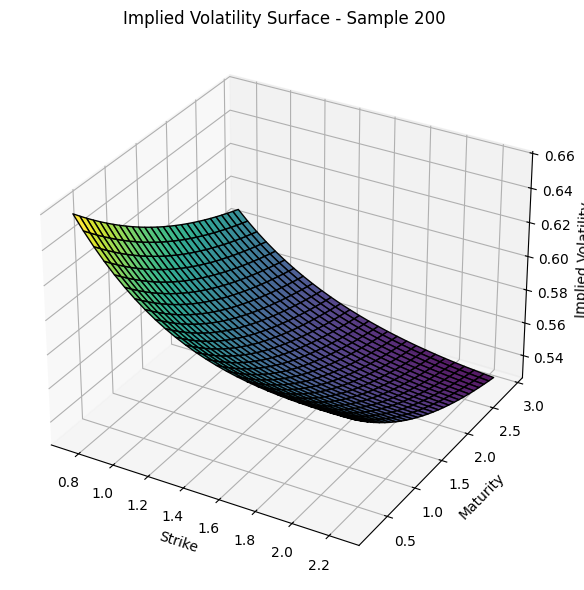

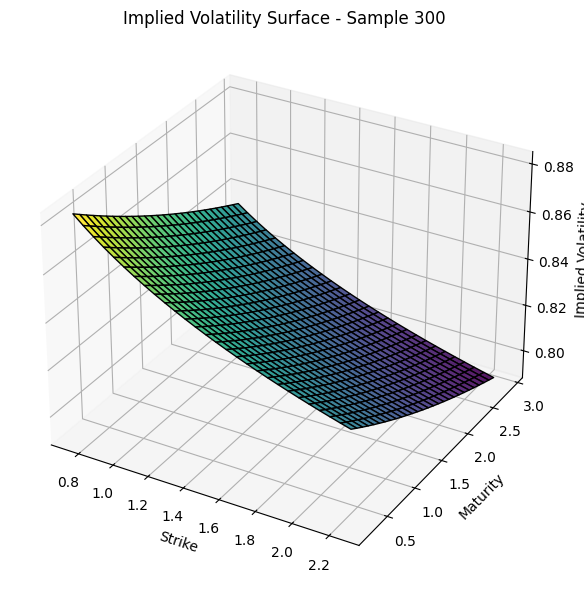

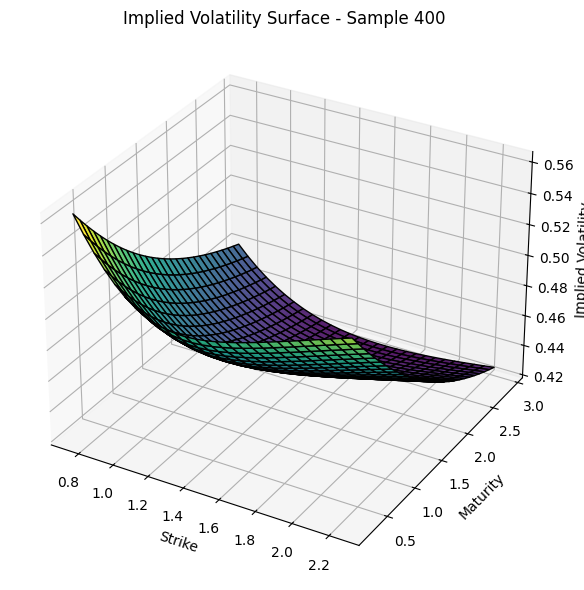

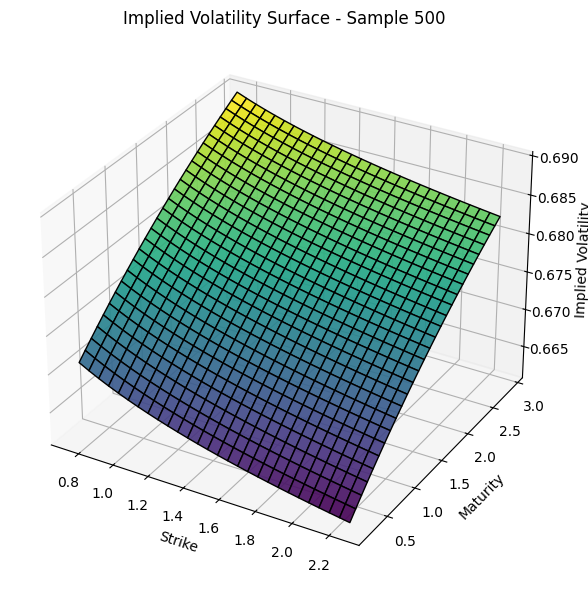

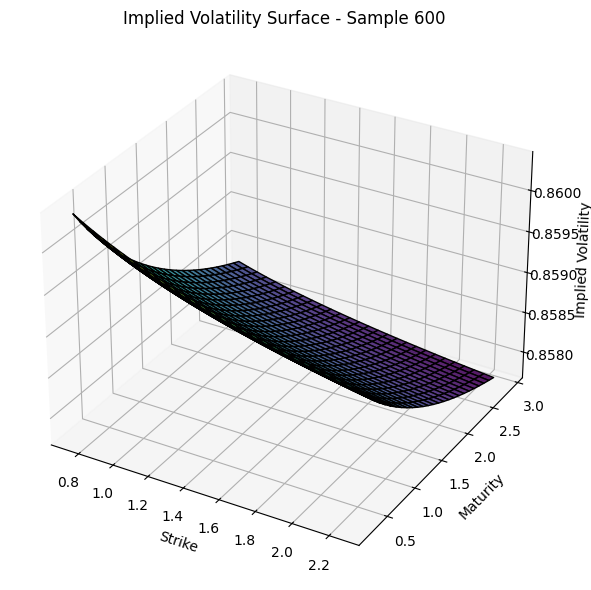

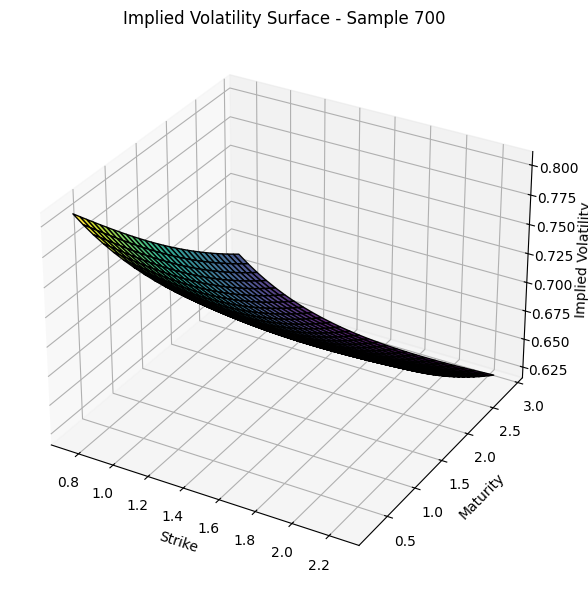

In [56]:
for i in range(0, 800, 100): 
    fig = plt.figure(figsize=(8, 6))
    ax = fig.add_subplot(111, projection='3d')

    
    IV = clean_merged_ivs_surface_pca[i]  

    # Plot surface
    ax.plot_surface(K, T, IV, cmap=cm.viridis, edgecolor='k', alpha=0.9)
    
    # Labels
    ax.set_title(f"Implied Volatility Surface - Sample {i}")
    ax.set_xlabel("Strike")
    ax.set_ylabel("Maturity")
    ax.set_zlabel("Implied Volatility")

    plt.tight_layout()
    plt.show()

In [57]:
def compute_vega(ivs, spot_prices, strike_prices, maturities, r=0.0):
    S = spot_prices[:, None, None]              # (n_assets, 1, 1)
    K = strike_prices[None, :, None]            # (1, n_strike, 1)
    T = maturities[None, None, :]               # (1, 1, n_maturity)
    sigma = ivs                                 # (n_assets, n_strike, n_maturity)


    d1 = (np.log(S / K) + (r + 0.5 * sigma**2) * T) / (sigma * np.sqrt(T))
    vega = S * sp.stats.norm.pdf(d1) * np.sqrt(T)        # same shape as ivs

    return vega

put_vega = compute_vega(clean_merged_ivs_surface_pca, spot_prices, k_s, t_s, r=r)
put_vega.shape

(821, 28, 28)

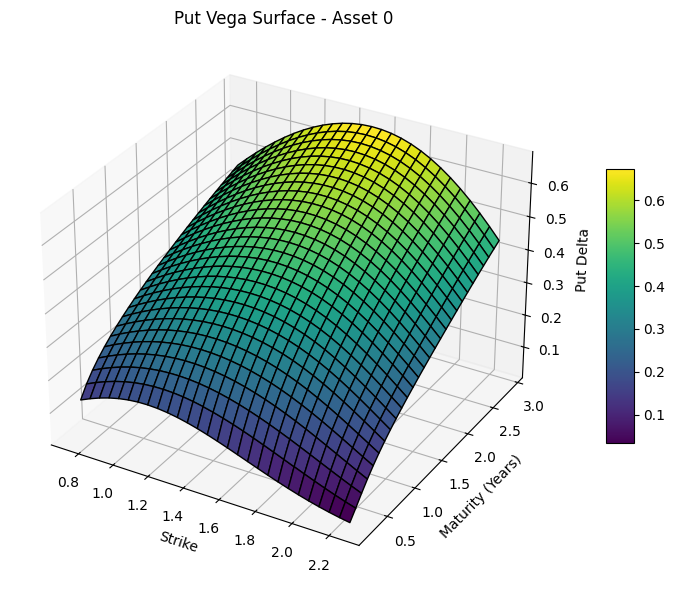

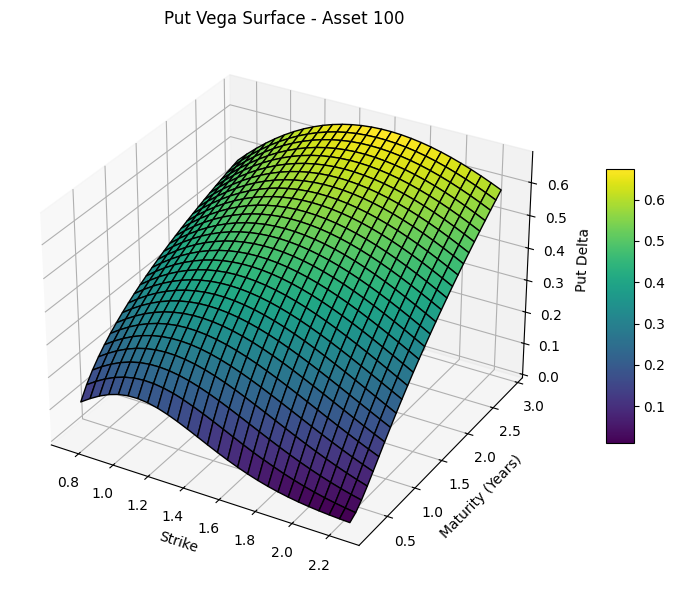

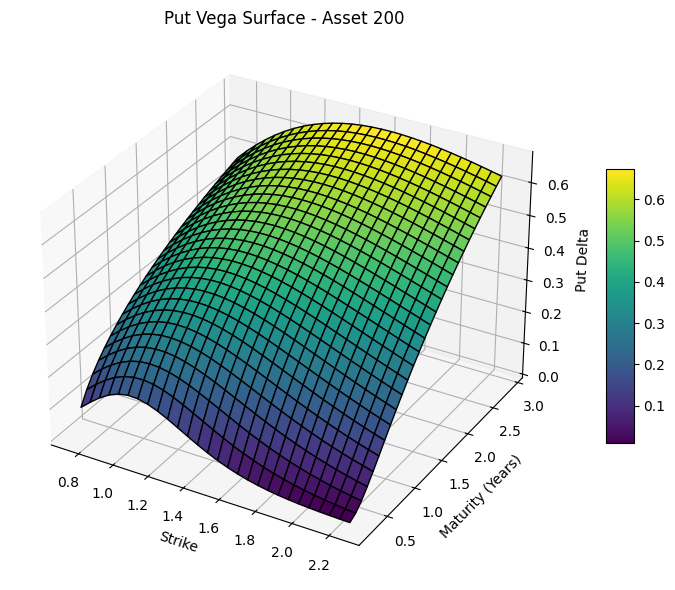

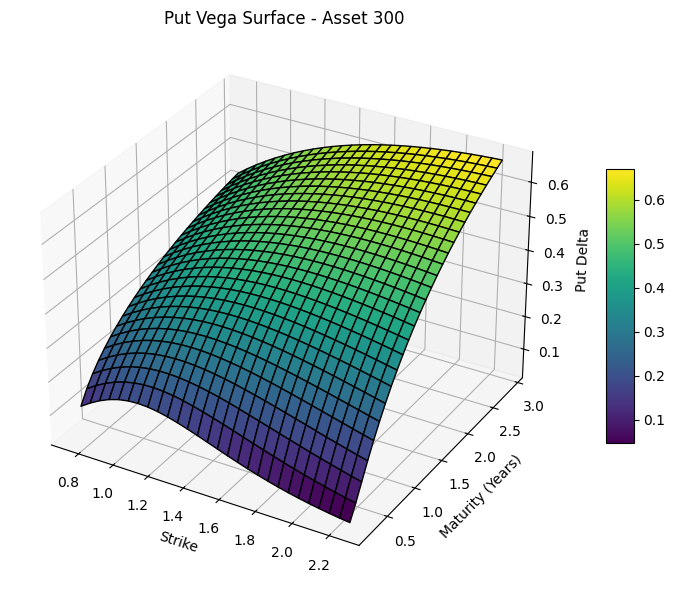

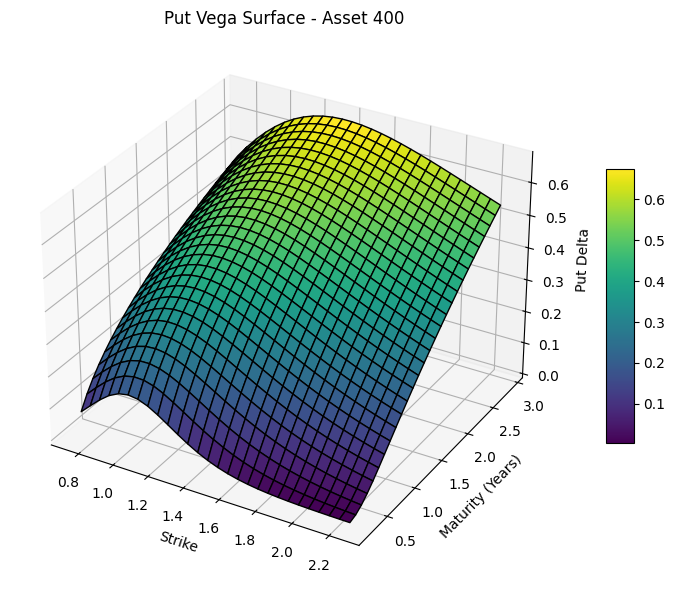

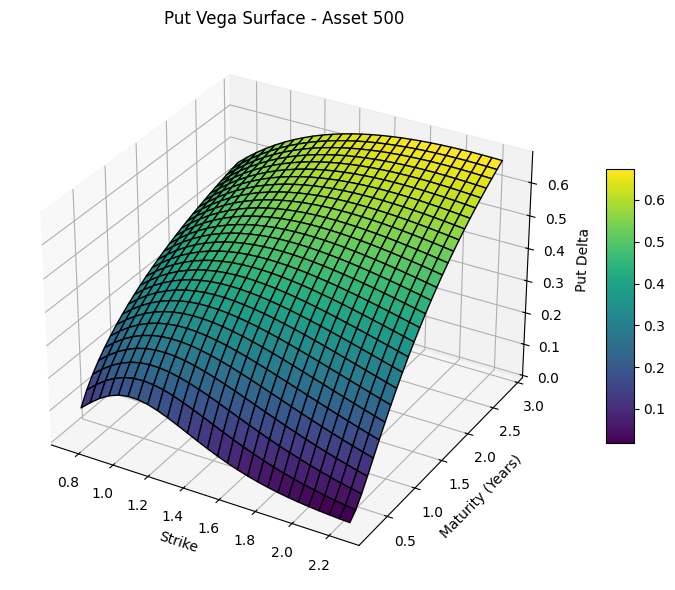

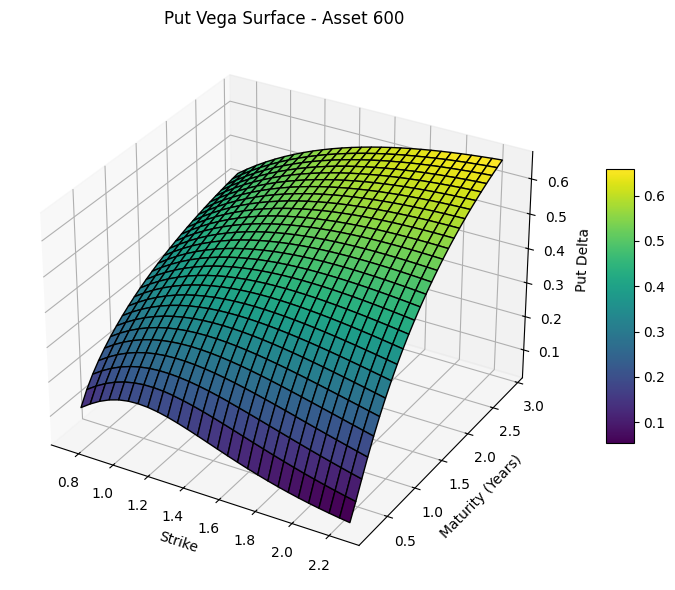

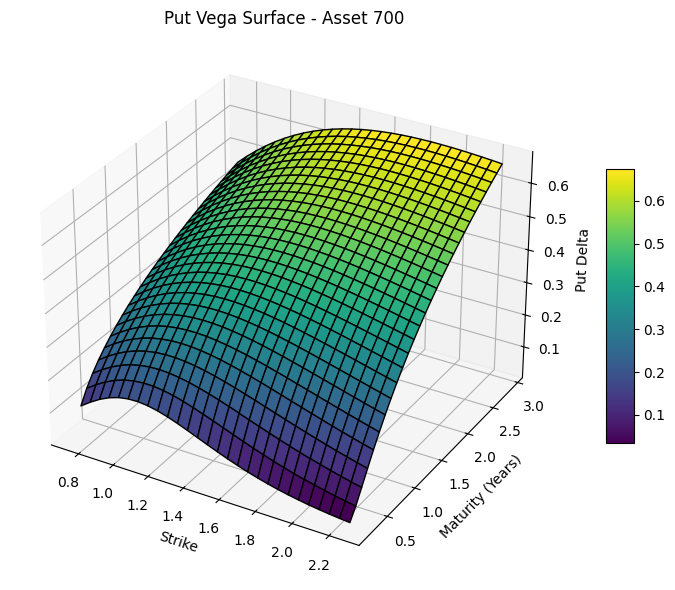

In [59]:
for i in range(0, 800, 100):  # or range(n_assets)
    pv = put_vega[i]  # shape: (n_strike, n_maturity)
    K, T = np.meshgrid(k_s, t_s, indexing='ij')  # shape: (n_strike, n_maturity)

    fig = plt.figure(figsize=(10, 6))
    ax = fig.add_subplot(111, projection='3d')

    surf = ax.plot_surface(K, T, pv, cmap=cm.viridis, edgecolor='k')

    ax.set_title(f"Put Vega Surface - Asset {i}")
    ax.set_xlabel("Strike")
    ax.set_ylabel("Maturity (Years)")
    ax.set_zlabel("Put Delta")
    fig.colorbar(surf, ax=ax, shrink=0.5, aspect=10)

    plt.tight_layout()
    plt.show()